In [1]:
using ITensors, ITensorMPS
using ITransverse
using ITensorExpMPO
using ITensors: Algorithm
using Plots
using Plots.PlotMeasures
using ProgressMeter
ProgressMeter.ijulia_behavior(:clear)

using Revise
includet("Alcaraz_2ndOrder_MPOgenerator.jl")

Hamiltonian given by:
$$H = -\sum_i \left( \sigma_i^z \sigma_{i+1}^z + \lambda \sigma_i^x \mathbf{+} p \sigma_i^z \sigma_{i+2}^z + p \lambda \sigma_i^x \sigma_{i+1}^x \right)$$

In [ ]:
# System Parameters

# N = 50        
lambda = 1.0    # exact critical point (self dual)
p = 0.0         # NNN term (p>0 breakes system's integrability)
dt = 0.1       
T_max = 3     
cutoff = 1e-12
maxdim = 200

200

### **HELPER FUNCTIONS**

In [ ]:
# ALCARAZ MODEL

function compute_alcaraz_entropies(
    mpo_generator::Function, target_T::Float64;
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    Ntime_steps = round(Int, target_T / dt)
    Nsteps = Ntime_steps + nbeta
    dbeta = -im * dt

    s = Index(2, "S=1/2")
    # init_state = up_state         # why this fails?
    # init_state = complex(state(s, "X+"))
    init_state = complex([1,1] / sqrt(2))  # |X+> state in Z basis
    
    # Build tMPO blocks
    mp_alcaraz = AlcarazParams(lambda=lambda, p=p, phys_site=s)
    tp = tMPOParams(mp=mp_alcaraz; dt=dt, nbeta=nbeta, scheme=AlcarazWII(), dbeta=dbeta, bl=init_state)   
    b = FwtMPOBlocks(tp)
    
    # Power Method Params
    pm_params = PMParams(;
        truncp = (; cutoff=cutoff, maxdim=maxdim, alg=alg), 
        opt_method = :nosym, 
        cutoffs = [cutoff], 
        maxdims = 2:2:maxdim, 
        itermax = 5000, 
        eps_converged = eps_converged, 
        normalization = "overlap",
        stuck_after = 200,
        compute_fidelity = true
    )

    # Dynamically determine spatial bond dimension
    dummy_sites = siteinds("S=1/2", 4) 
    sample_mpo = mpo_generator(dummy_sites, lambda, p; dt=dt)
    spatial_bond_dim = dim(linkind(sample_mpo, 1))

    time_sites  = addtags(siteinds(spatial_bond_dim, Nsteps; conserve_qns=false), "time")
    mpo         = fw_tMPO(b, time_sites, tr=init_state)
    start_mps   = fw_tMPS(b, time_sites; tr=init_state, LR=:right)

    # Run Power Method
    psi_L, psi_R, pm_info = ITransverse.powermethod_lr(start_mps, mpo, mpo, pm_params)

    # Normalize just in case
    norm = overlap_noconj(psi_L, psi_R)
    psi_L ./= sqrt(norm)
    psi_R ./= sqrt(norm)

    # Calculate entropy profiles (real & imaginary)
    p_r2_real = real.(ITransverse.gen_renyi2(psi_L, psi_R))
    p_r2_imag = imag.(ITransverse.gen_renyi2(psi_L, psi_R))

    bonds = 1:length(p_r2_real)
    ds_history = pm_info[:ds]   # difference in singular values between two consecutive iterations of the Power Method (if small, it converged)

    return bonds, p_r2_real, p_r2_imag, ds_history
end

function plot_entropy_evolution(
    mpo_generator::Function, 
    target_times::Vector{Float64};
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    center_real = Float64[]
    center_imag = Float64[]
    actual_times = Float64[]

    # Top row: Profiles
    p_prof_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                       legend=:outertopright, grid=true)
    p_prof_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                       legend=:outertopright, grid=true)
    
    # Bottom row: Center Bond Growth
    p_cent_real = plot(title="Re(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Re(S₂) Temp Ent.", 
                       legend=false, marker=:circle, lw=2, color=:blue, grid=true)
    p_cent_imag = plot(title="Im(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Im(S₂) Temp Ent.", 
                       legend=false, marker=:square, lw=2, color=:red, grid=true)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im = compute_alcaraz_entropies(
            mpo_generator, T; 
            lambda=lambda, p=p, dt=dt, cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )

        # Normalize x axis
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)
        
        center_idx = div(length(r2_re), 2) + 1
        push!(center_real, r2_re[center_idx])
        push!(center_imag, r2_im[center_idx])
        push!(actual_times, T)
        
        time_label = "t = $(round(T, digits=2))"
        
        plot!(p_prof_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(p_prof_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end
    
    plot!(p_cent_real, actual_times, center_real)
    plot!(p_cent_imag, actual_times, center_imag)

    final_plot = plot(
        p_prof_real, p_prof_imag, p_cent_real, p_cent_imag, 
        layout=(2, 2), 
        size=(1200, 800),
        margin=5Plots.mm,
        plot_title="Alcaraz Model Temporal Entanglement (p=$p, lambda=$lambda)"
    )
    display(final_plot)
    
    return actual_times, center_real, center_imag
end

# ISING MODEL

function compute_ising_entropies(
    target_T::Float64;
    JXX::Float64=1.0, hz::Float64=1.0, gx::Float64=0.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    Ntime_steps = round(Int, target_T / dt)
    Nsteps = Ntime_steps + nbeta
    dbeta = -im * dt

    s = Index(2, "S=1/2")
    init_state = up_state
    
    # Build tMPO blocks
    mp_ising = IsingParams(JXX, hz, gx)
    tp = tMPOParams(dt, dbeta, expH_ising_murg, mp_ising, nbeta, init_state)    
    b = FwtMPOBlocks(tp)
    
    # Power Method Params
    pm_params = PMParams(;
        truncp = (; cutoff=cutoff, maxdim=maxdim, alg=alg), 
        opt_method = :nosym, 
        cutoffs = [cutoff], 
        maxdims = 2:2:maxdim, 
        itermax = 5000, 
        eps_converged = eps_converged, 
        normalization = "overlap",
        stuck_after = 200,
        compute_fidelity = true
    )

    time_sites = addtags(siteinds("S=1/2", Nsteps; conserve_qns=false), "time")
    mpo = fw_tMPO(b, time_sites; tr=tp.bl)
    start_mps = fw_tMPS(b, time_sites; tr=tp.bl, LR=:right)

    # Run Power Method
    psi_L, psi_R, _ = ITransverse.powermethod_lr(start_mps, mpo, mpo, pm_params)

    # Calculate entropy profiles (real & imaginary)
    p_r2_real = real.(ITransverse.gen_renyi2(psi_L, psi_R))
    p_r2_imag = imag.(ITransverse.gen_renyi2(psi_L, psi_R))

    bonds = 1:length(p_r2_real)

    return bonds, p_r2_real, p_r2_imag
end

function plot_ising_entropy_evolution(
    target_times::Vector{Float64};
    JXX::Float64=1.0, hz::Float64=1.0, gx::Float64=0.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="naiveRTM", eps_converged::Float64=1e-6, nbeta::Int=4
)

    center_real = Float64[]
    center_imag = Float64[]
    actual_times = Float64[]

    # Top row: Profiles
    p_prof_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                       legend=:outertopright, grid=true)
    p_prof_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                       legend=:outertopright, grid=true)
    
    # Bottom row: Center Bond Growth
    p_cent_real = plot(title="Re(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Re(S₂) Temp Ent.", 
                       legend=false, marker=:circle, lw=2, color=:blue, grid=true)
    p_cent_imag = plot(title="Im(S₂) Temp. Entanglement (center)", xlabel="Time (t)", ylabel="Im(S₂) Temp Ent.", 
                       legend=false, marker=:square, lw=2, color=:red, grid=true)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im = compute_ising_entropies(
            T; 
            JXX=JXX, hz=hz, gx=gx, dt=dt, 
            cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )
        
        # Normalize x axis
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)

        center_idx = div(length(r2_re), 2) + 1
        push!(center_real, r2_re[center_idx])
        push!(center_imag, r2_im[center_idx])
        push!(actual_times, T)
        
        time_label = "t = $(round(T, digits=2))"
        
        plot!(p_prof_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(p_prof_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end
    
    plot!(p_cent_real, actual_times, center_real)
    plot!(p_cent_imag, actual_times, center_imag)

    final_plot = plot(
        p_prof_real, p_prof_imag, p_cent_real, p_cent_imag, 
        layout=(2, 2), 
        size=(1200, 800),
        margin=5Plots.mm,
        plot_title="Ising Model Temporal Entanglement (J=$JXX, hz=$hz, gx=$gx)"
    )
    display(final_plot)
    
    return actual_times, center_real, center_imag
end

plot_ising_entropy_evolution (generic function with 1 method)

[PM LR|naiveRTM|nosym] L=104, cutoff=1.0e-12, maxdim=150, normalize=overlap)   6%  ETA: 0:05:16 (67.18 ms/it)
   Info: [300]  chi=8 | ds=0.0005995636953892713 | <R|Rprev> = -7.603592140316738e-8┌ Warning: PM Stuck after 201/302 steps | ds=0.0005770685562624667 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/HS6vK/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:32


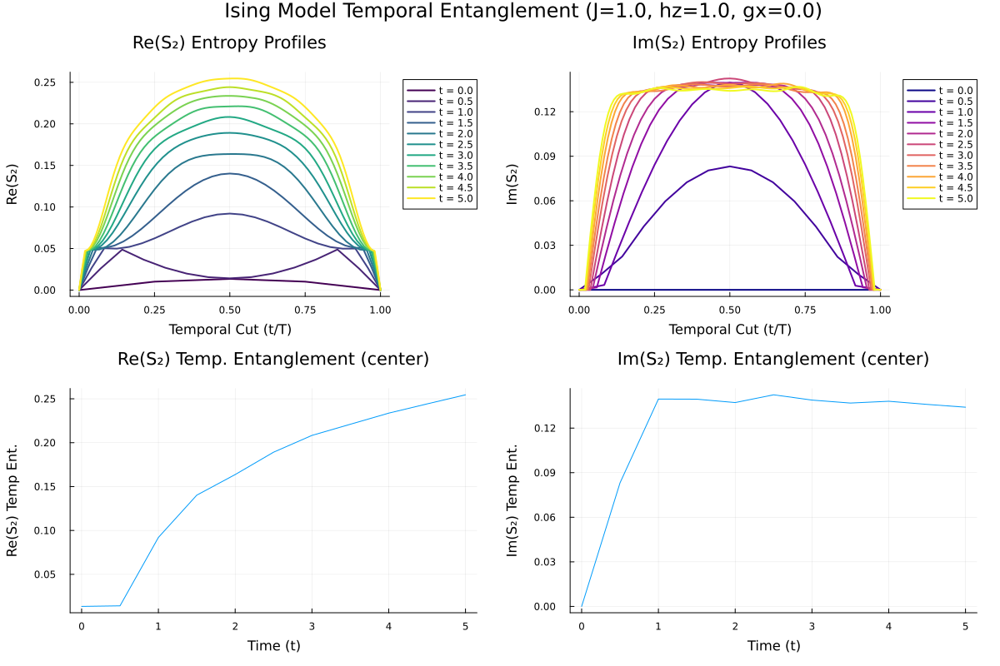

([0.0, 0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.013442993109638255, 0.014102752099510455, 0.09204816428252244, 0.1402332904892373, 0.16369849897111236, 0.18918121426074172, 0.20831978579183508, 0.22102073722442547, 0.23369203372674807, 0.24421698162182212, 0.25456833749756763], [-0.0, 0.08315938762786883, 0.13953862971338396, 0.13945301855379724, 0.13717705927164592, 0.14239419977274617, 0.1388467266615361, 0.13684800445115622, 0.13805181611124479, 0.13594227807597523, 0.13405374619866378])

In [4]:
# Test times from t=0.2 to t=2.0
test_times = collect(0.0 : 0.5 : 5.0)

# Execute the simulation
times, c_real, c_imag = plot_ising_entropy_evolution(
    test_times;
    JXX = 1.0, 
    hz = 1.0,   # Transverse field (Set to 1.0 for the critical point if gx=0)
    gx = 0.0,   # Longitudinal field
    dt = 0.05,
    maxdim = 150
)

---

[PM LR|naiveRTM] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:03:02 (38.75 ms/it)
   Info: [296]  chi=8 | ds=0.0001434671844173785 | <R|Rprev> = -5.8062659505467397e-8┌ Warning: PM Stuck after 201/298 steps | ds=0.00011837717008844617 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:00:27


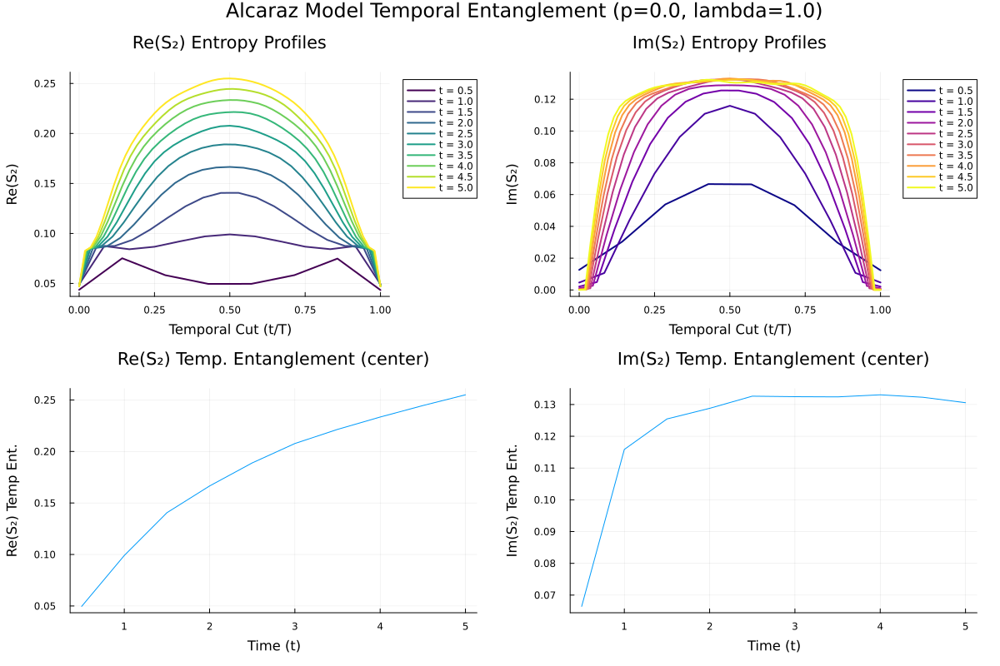

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.04959138783705098, 0.09902757811540452, 0.14055691027577782, 0.16650231906298535, 0.1888966764456466, 0.20771378987017652, 0.22142922891503322, 0.23342140631936112, 0.2445486680355198, 0.25499397363301396], [0.06643520175733826, 0.11586072116032614, 0.12545896272769774, 0.12880284742334122, 0.1326275531232522, 0.13246715364145276, 0.13240559538426536, 0.1330592609440853, 0.13228590383979097, 0.13057273293643434])

In [ ]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.1, maxdim=250, alg="RTM"
)

[PM LR|naiveRTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   6%  ETA: 0:06:26 (81.97 ms/it)
   Info: [292]  chi=8 | ds=0.0003067949905857237 | <R|Rprev> = -8.456705616653417e-8┌ Warning: PM Stuck after 201/294 steps | ds=0.0005496505837601084 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:01:05


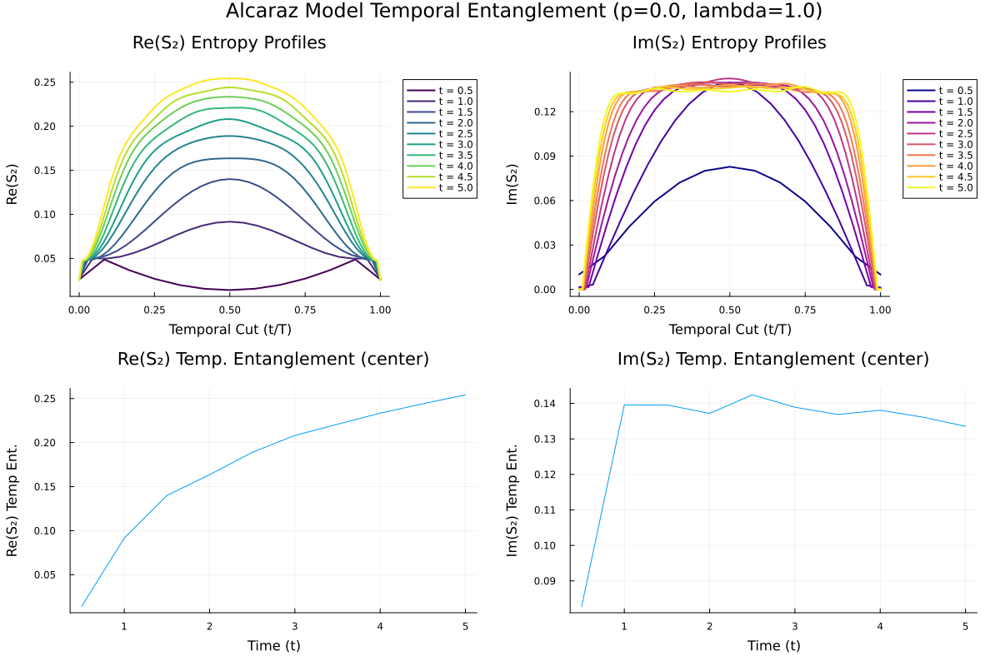

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [0.014002238260800328, 0.09162634778237706, 0.1400079359973874, 0.16358189669539694, 0.18895039227258556, 0.2081442190645224, 0.22091226571752773, 0.23347086350963892, 0.24410158935297024, 0.2542817155325475], [0.08281199028057688, 0.1395840666394611, 0.13955943166016377, 0.13718492394936257, 0.142427661167824, 0.13892398910838238, 0.13689156051382315, 0.13807109254867753, 0.1361187661319834, 0.13355578157452935])

In [ ]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.05, maxdim=250, alg="RTM"
)

[PM LR|naiveRTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 0:28:58 ( 0.37  s/it)
   Info: [338]  chi=8 | ds=0.0007249870817820359 | <R|Rprev> = -1.5268819717689168e-7┌ Warning: PM Stuck after 201/339 steps | ds=0.000840551926477473 | chi=7)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Progress: 100%|█████████████████████████████████████████| Time: 0:07:03


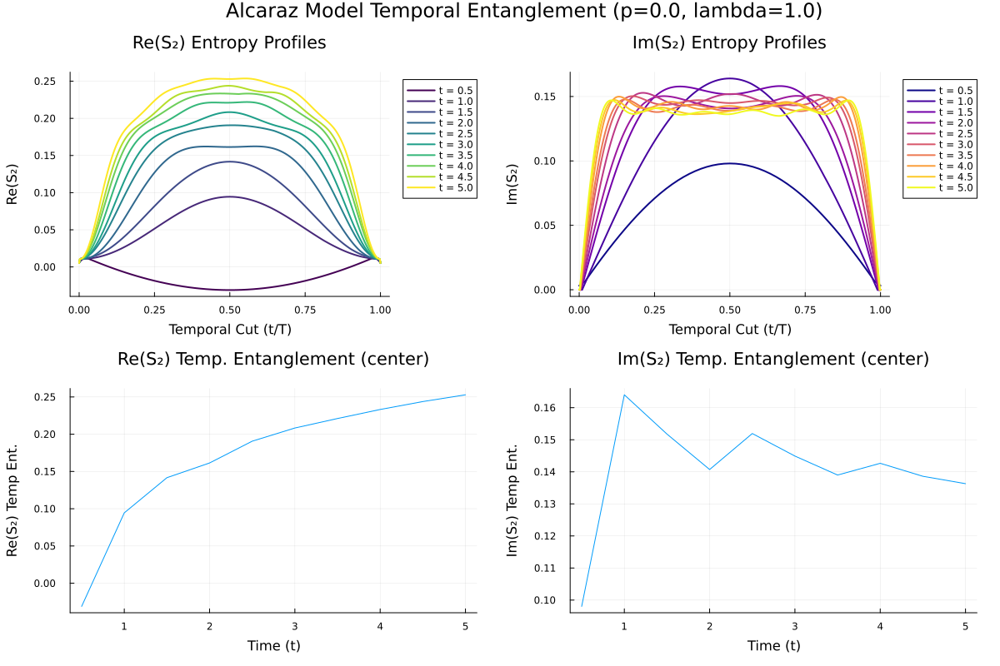

([0.5, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0], [-0.031110995301321484, 0.09446320651922445, 0.1416662474326061, 0.1614108150554016, 0.19064632322671493, 0.20832960212705928, 0.2210612557060694, 0.23317882303060364, 0.2438097279579056, 0.2528733190269786], [0.0980242475873793, 0.16401687046343677, 0.15176630661786916, 0.14071769195733821, 0.15194068900978028, 0.14491263527470039, 0.1389958536221275, 0.14265581104069433, 0.1386077342722137, 0.13630123226356947])

In [ ]:
target_times = collect(0.5 : 0.5 : 5.0)
mpo_generator = expH_alcaraz
p_val = 0.0

times, c_real, c_imag = plot_entropy_evolution(
    mpo_generator, target_times; 
    p=p_val, lambda=1.0,
    dt=0.01, maxdim=250, alg="RTM"
)

probando para distintos dt, vemos que el "sweet spot" para nuestras simulaciones (donde observamos mejor correlación con Ising) se encuentra alrededor de **$dt=0.05$**

para dt más grande, el error de Trotter es mayor, mientras que para dt más pequeños, se vuelve más complicado truncar las tMPS y PowerMethod oscila más y tenemos peores resultados por algún motivo (tengo que estudiar más en detalle por qué ocurre esto)

---

Vamos a probar para $dt=0.05$ distintos valores de $p$ (hasta $p=1.5$ where the Alcaraz Model leaves the Ising's universality class)

In [5]:
# helper functions (same as plot_entropy_evolution but only profiles, no center growth)

function plot_entropy_profiles(
    mpo_generator::Function, 
    target_times::Vector{Float64};
    p::Float64=0.0, lambda::Float64=1.0,
    dt::Float64=0.1, cutoff::Float64=1e-12, maxdim::Int=256, 
    alg::String="RTM", eps_converged::Float64=1e-6, nbeta::Int=4
)
    plt_real = plot(title="Re(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Re(S₂)", 
                    legend=:outerright, grid=true, framestyle=:box)
    plt_imag = plot(title="Im(S₂) Entropy Profiles", xlabel="Temporal Cut (t/T)", ylabel="Im(S₂)", 
                    legend=:outerright, grid=true, framestyle=:box)

    n_times = length(target_times)
    colors_real = cgrad(:viridis, n_times, categorical=true)
    colors_imag = cgrad(:plasma, n_times, categorical=true)

    @showprogress "Computing Profiles for p=$p..." for (i, T) in enumerate(target_times)
        bonds, r2_re, r2_im, _ = compute_alcaraz_entropies(
            mpo_generator, T; 
            lambda=lambda, p=p, dt=dt, cutoff=cutoff, maxdim=maxdim, 
            alg=alg, eps_converged=eps_converged, nbeta=nbeta
        )

        # Normalize x axis (Temporal Cut t/T)
        n_bonds = length(r2_re)
        x_normalized = range(0.0, 1.0, length=n_bonds)
        
        time_label = "t = $(round(T, digits=1))"
        
        plot!(plt_real, x_normalized, r2_re, label=time_label, lw=2, color=colors_real[i])
        plot!(plt_imag, x_normalized, r2_im, label=time_label, lw=2, color=colors_imag[i])
    end

    # 1x2 layout
    final_plot = plot(
        plt_real, plt_imag, 
        layout=(1, 2), 
        size=(1200, 450), # Adjusted aspect ratio for a 1x2 spread
        margin=5Plots.mm,
        plot_title="Alcaraz Model Temporal Entanglement (p=$p, lambda=$lambda)"
    )
    
    return final_plot
end

plot_entropy_profiles (generic function with 1 method)

---
$p=0$

[PM LR|densitymatrix] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 0:07:37 (93.64 ms/it)
   Info: [123]  chi=24 | ds=1.7138413886952364e-6 | <R|Rprev> = -1.2598027559423346e-11[ Info: PM Converged after 124 steps | ds=7.755529673192374e-7 | chi=24)
Computing Profiles for p=0.0... 100%|████████████████████| Time: 0:00:30


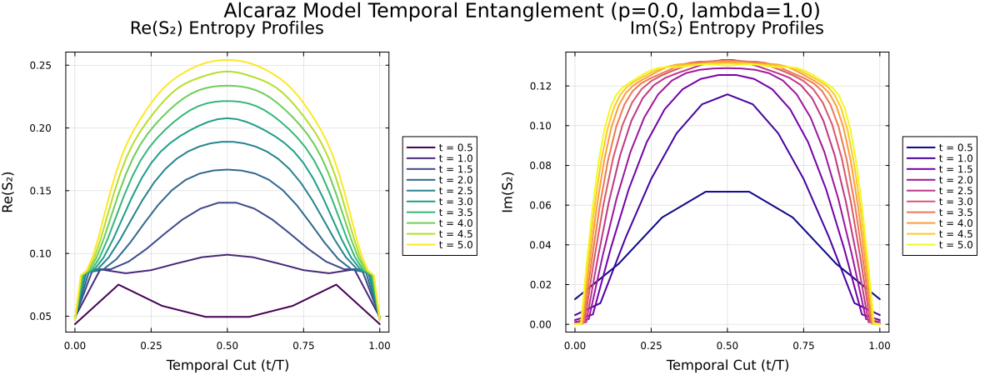

In [21]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.0
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="densitymatrix"
)

display(fig)

[PM LR|densitymatrix] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   3%  ETA: 0:18:45 ( 0.23  s/it)
   Info: [172]  chi=24 | ds=2.3384415726024343e-6 | <R|Rprev> = -8.891458082625437e-12[ Info: PM Converged after 173 steps | ds=7.787880270948566e-7 | chi=24)
Computing Profiles for p=0.0... 100%|████████████████████| Time: 0:01:33


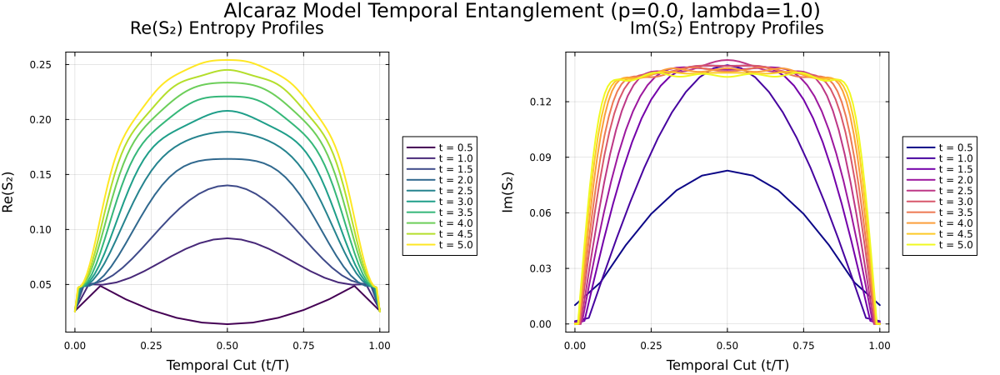

In [22]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.0
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="densitymatrix"
)

display(fig)

[PM LR|densitymatrix] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)   5%  ETA: 1:17:41 ( 0.98  s/it)
   Info: [266]  chi=23 | ds=1.9960785756500954e-6 | <R|Rprev> = -1.5661295012170925e-12[ Info: PM Converged after 267 steps | ds=9.360131364433144e-7 | chi=23)
Computing Profiles for p=0.0... 100%|████████████████████| Time: 0:10:41


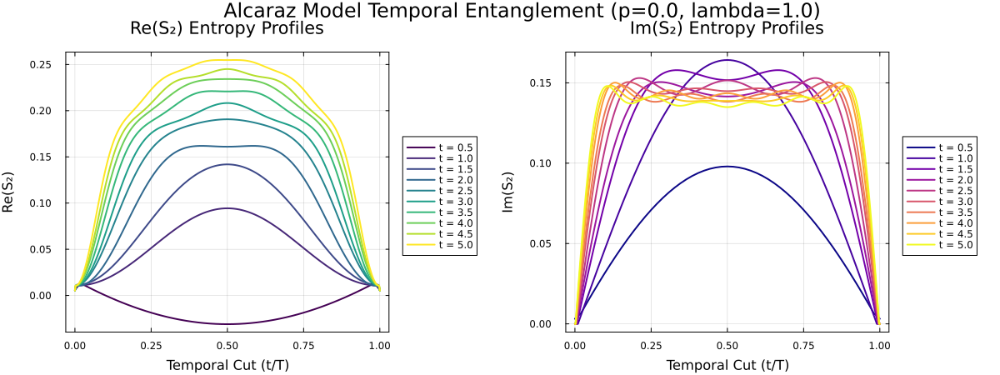

In [23]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.0
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="densitymatrix"
)

display(fig)

---
$p=0.1$

[PM LR|naiveRTM] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   8%  ETA: 0:03:24 (44.38 ms/it)
   Info: [402]  chi=8 | ds=2.8001559895463046e-5 | <R|Rprev> = -1.040598733395673e-7┌ Warning: PM Stuck after 201/404 steps | ds=2.800202563080223e-5 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:01:38


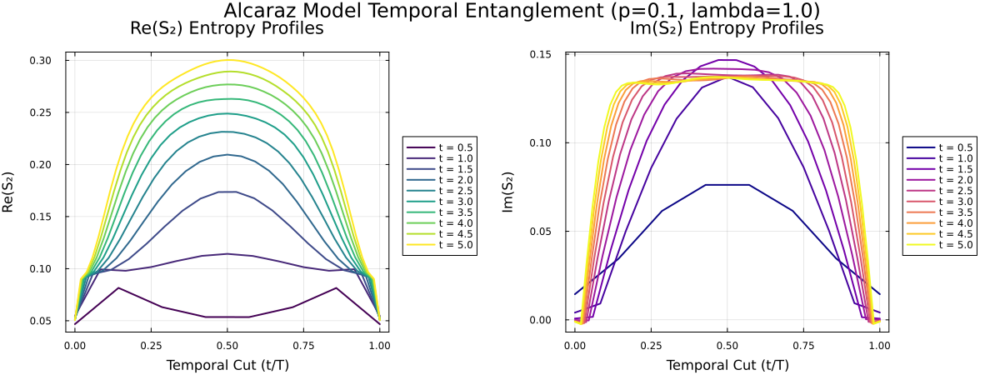

In [ ]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|densitymatrix] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   4%  ETA: 0:21:59 ( 0.27  s/it)
   Info: [190]  chi=34 | ds=1.9832219513293836e-6 | <R|Rprev> = -1.267578622312884e-9[ Info: PM Converged after 191 steps | ds=9.896775770568134e-7 | chi=34)
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:02:00


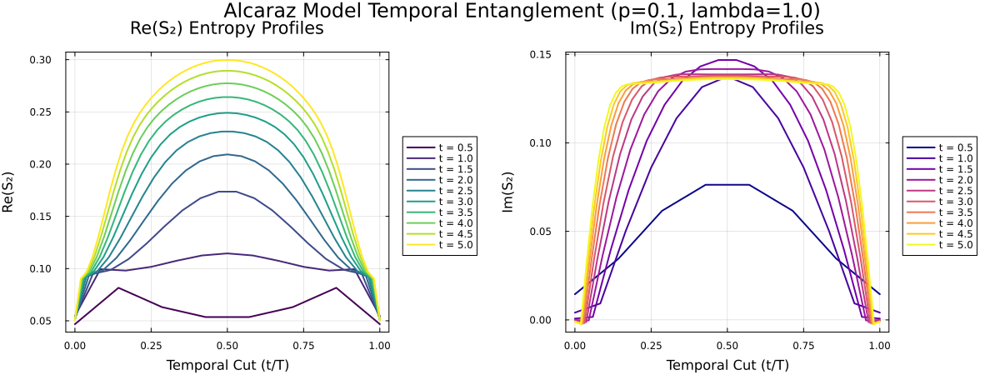

In [24]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|naiveRTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)  12%  ETA: 0:06:53 (93.97 ms/it)
   Info: [603]  chi=8 | ds=6.0503517866017376e-5 | <R|Rprev> = -5.141474012990357e-8┌ Warning: PM Stuck after 201/604 steps | ds=5.995485559093239e-5 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:02:17


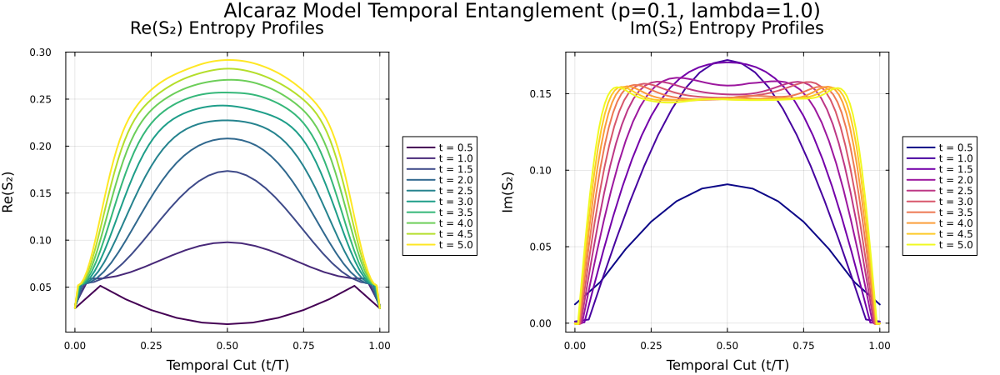

In [ ]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|densitymatrix] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   8%  ETA: 0:48:43 ( 0.63  s/it)
   Info: [391]  chi=35 | ds=1.1806012490955808e-6 | <R|Rprev> = -8.706784801684528e-10[ Info: PM Converged after 392 steps | ds=8.964871795469342e-7 | chi=35)
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:08:49


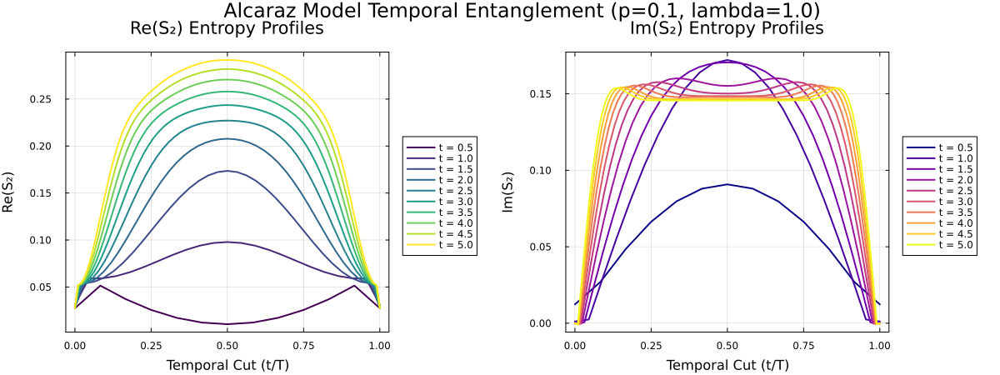

In [25]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|RTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)  17%  ETA: 0:23:03 ( 0.33  s/it)
   Info: [834]  chi=10 | ds=0.0334589377635901 | <R|Rprev> = -9.203111488853378e-6┌ Warning: PM Stuck after 201/835 steps | ds=0.04950511441013822 | chi=10)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:19:18


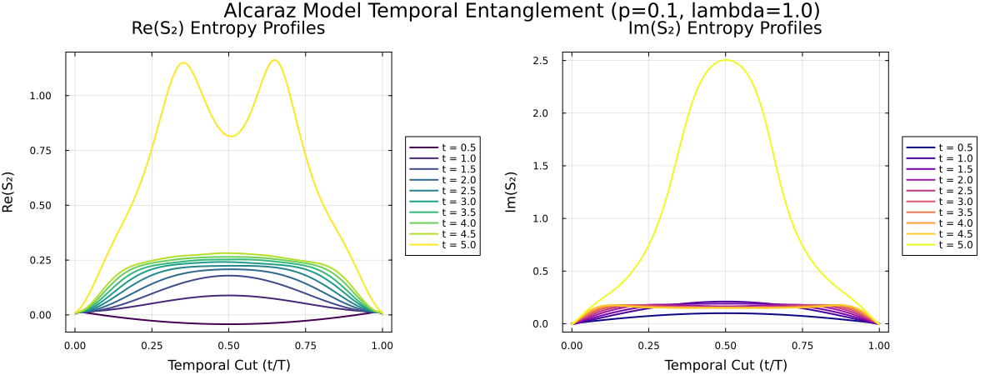

In [20]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=1204, cutoff=1.0e-12, maxdim=250, normalize=overlap)  28%  ETA: 1:05:07 ( 1.09  s/it)
   Info: [1407]  chi=8 | ds=0.004987133032201663 | <R|Rprev> = -7.697632646510053e-6┌ Warning: PM Stuck after 201/1408 steps | ds=0.0038602433665517744 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.0... 100%|████████████████████| Time: 0:34:50


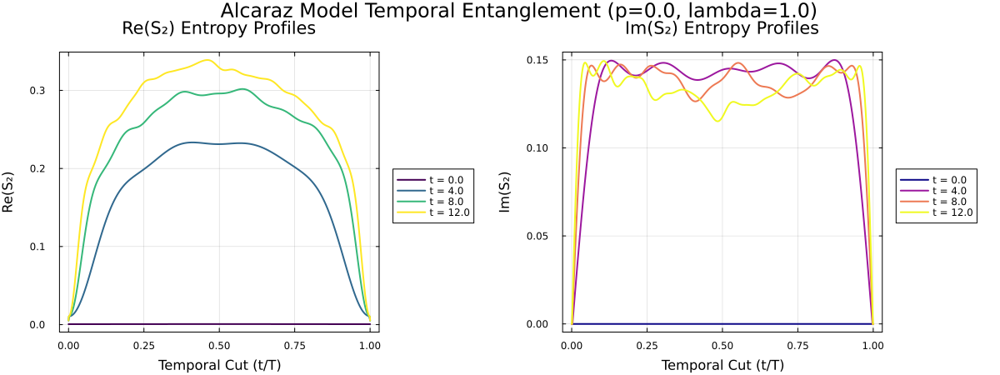

In [ ]:
target_times = collect(0.0 : 4.0 : 12.0)


p_val=0.0
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=244, cutoff=1.0e-12, maxdim=250, normalize=overlap)  20%  ETA: 0:13:36 ( 0.20  s/it)
   Info: [1001]  chi=10 | ds=0.0013800279079393407 | <R|Rprev> = -1.3300280796790433e-5┌ Warning: PM Stuck after 201/1002 steps | ds=0.0010371114157731176 | chi=10)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.0... 100%|████████████████████| Time: 0:04:19


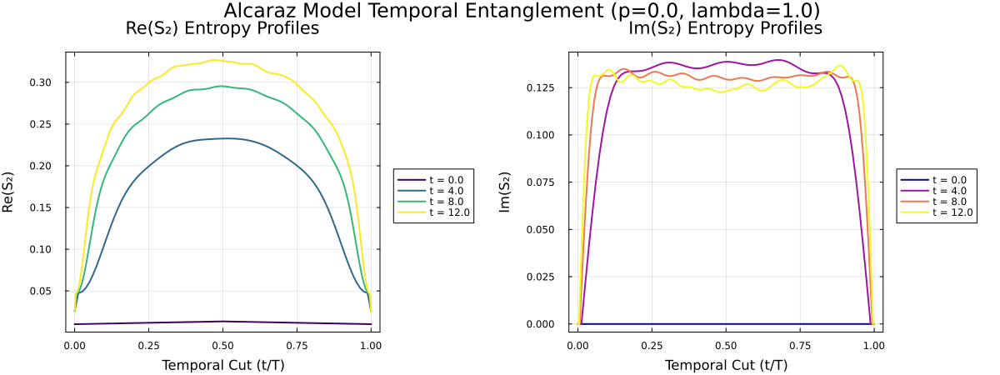

In [8]:
target_times = collect(0.0 : 4.0 : 12.0)


p_val=0.0
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|densitymatrix] L=164, cutoff=1.0e-12, maxdim=250, normalize=overlap)   8%  ETA: 1:09:19 ( 0.91  s/it)
   Info: [413]  chi=38 | ds=1.6588423439323208e-6 | <R|Rprev> = -1.1258187877884422e-10[ Info: PM Converged after 414 steps | ds=9.310047088539886e-7 | chi=38)


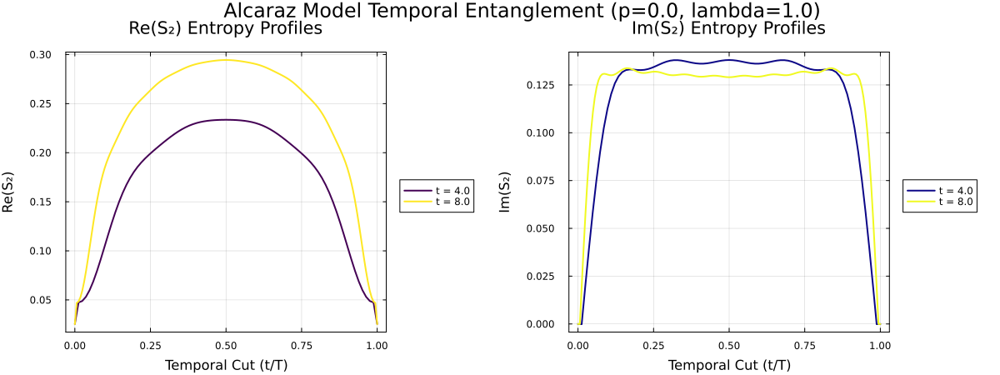

In [9]:
target_times = collect(4.0 : 4.0 : 8.0)


p_val=0.0
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|RTM] L=1204, cutoff=1.0e-12, maxdim=250, normalize=overlap)  15%  ETA: 2:39:14 ( 2.24  s/it)
   Info: [741]  chi=13 | ds=0.013098898345387605 | <R|Rprev> = -9.564682883268133e-7┌ Warning: PM Stuck after 201/742 steps | ds=0.008699505340256847 | chi=13)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:45:01


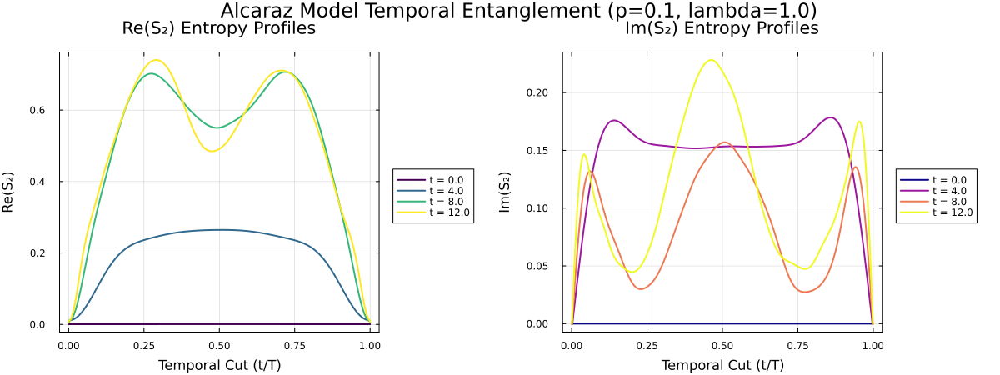

In [27]:
target_times = collect(0.0 : 4.0 : 12.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|RTM] L=252, cutoff=1.0e-12, maxdim=250, normalize=overlap)  12%  ETA: 0:27:12 ( 0.37  s/it)
   Info: [580]  chi=12 | ds=0.03916790478630555 | <R|Rprev> = -6.246910885507989e-6┌ Warning: PM Stuck after 201/581 steps | ds=0.028460266311761684 | chi=12)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:07:04


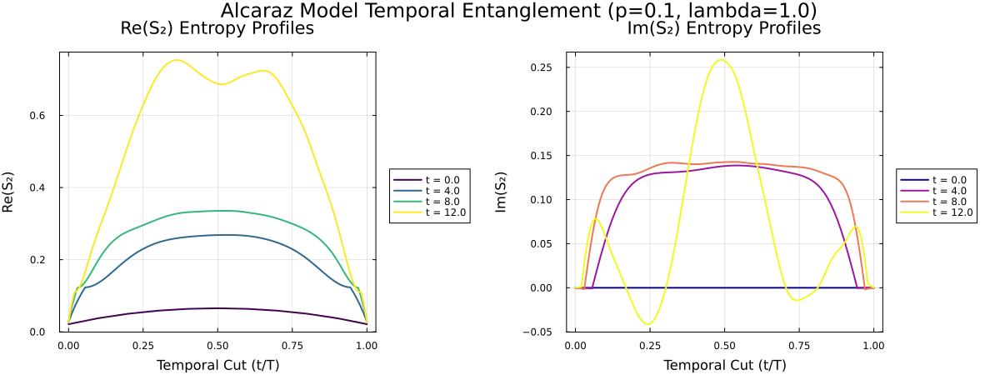

In [10]:
target_times = collect(0.0 : 4.0 : 12.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM", nbeta=12
)

display(fig)


[PM LR|densitymatrix] L=804, cutoff=1.0e-12, maxdim=250, normalize=overlap)  32%  ETA: 13:14:24 (14.03  s/it)
   Info: [1603]  chi=76 | ds=3.393991564043519e-6 | <R|Rprev> = -1.6736197833901613e-15[ Info: PM Converged after 1604 steps | ds=9.305054285424497e-7 | chi=76)


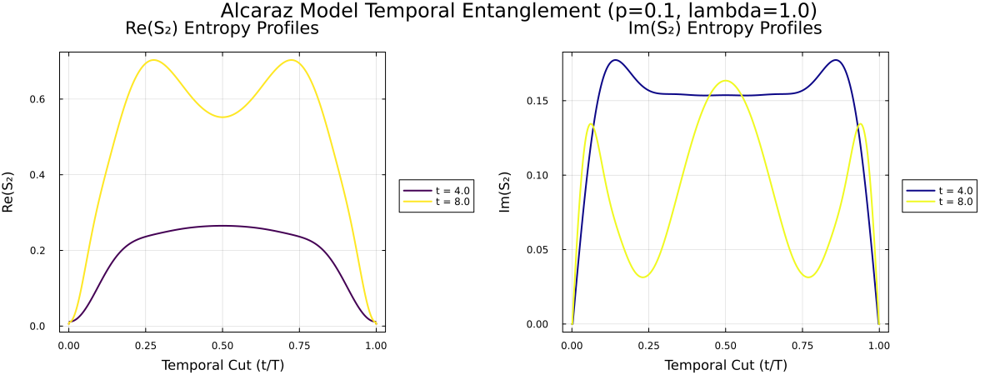

In [29]:
target_times = collect(4.0 : 4.0 : 8.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|RTM] L=172, cutoff=1.0e-12, maxdim=250, normalize=overlap)  19%  ETA: 0:07:02 ( 0.10  s/it)
   Info: [935]  chi=8 | ds=0.00025829124140785975 | <R|Rprev> = -9.682554681263974e-7┌ Warning: PM Stuck after 201/936 steps | ds=0.00019452340560019432 | chi=8)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151


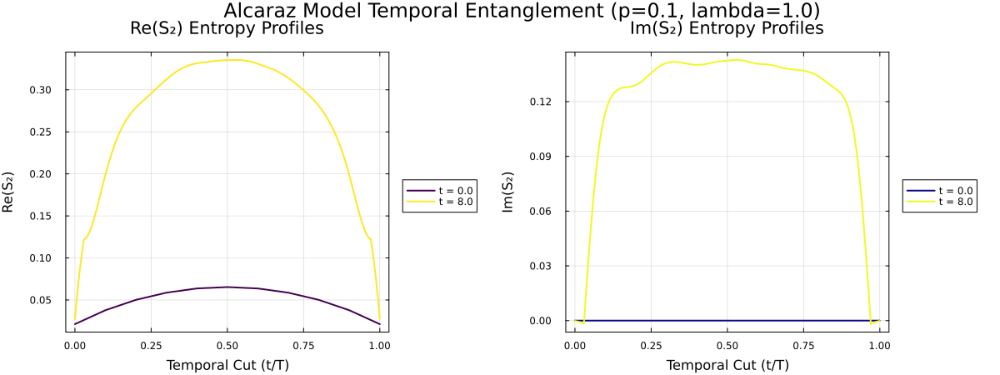

In [35]:
target_times = [0.0, 8.0]

# vamos a ver si sigue el bump en el centro con nbeta=12
p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM", nbeta=12
)

display(fig)


[PM LR|RTM] L=172, cutoff=1.0e-12, maxdim=250, normalize=overlap)  13%  ETA: 0:10:34 ( 0.15  s/it)
   Info: [637]  chi=12 | ds=5.638216557263265e-5 | <R|Rprev> = -1.3120150495753642e-9┌ Warning: PM Stuck after 201/638 steps | ds=5.46837967443925e-5 | chi=12)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151


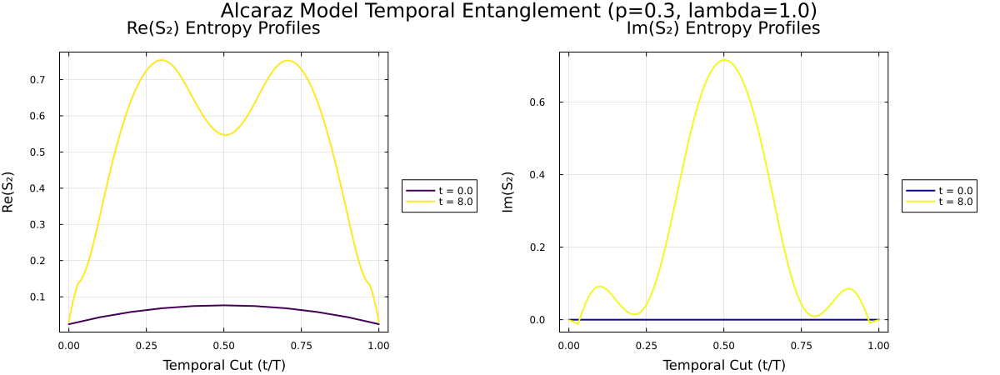

In [38]:
target_times = [0.0, 8.0]

# vamos a ver si sigue el bump en el centro con nbeta=12
p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM", nbeta=12
)

display(fig)


[PM LR|RTM] L=190, cutoff=1.0e-12, maxdim=250, normalize=overlap)  18%  ETA: 0:09:21 ( 0.14  s/it)
   Info: [906]  chi=10 | ds=0.0036185721160810203 | <R|Rprev> = -0.00021257119683513182┌ Warning: PM Stuck after 201/907 steps | ds=0.003552538433529817 | chi=10)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151


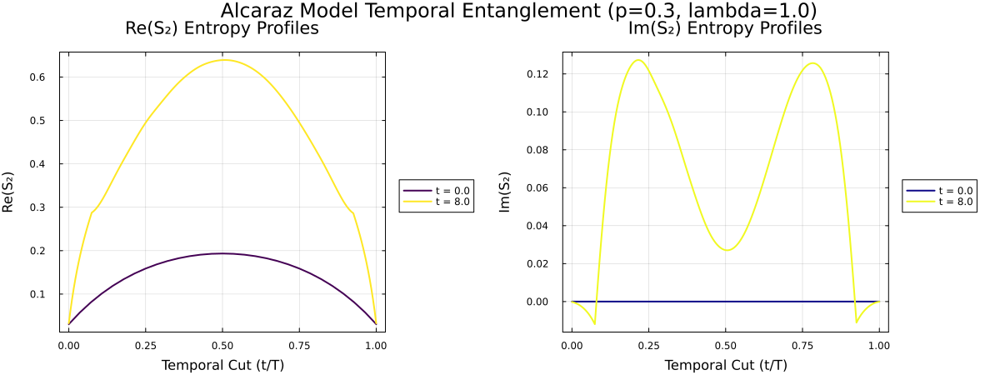

In [39]:
target_times = [0.0, 8.0]

# vamos a ver si sigue el bump en el centro con nbeta=12
p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM", nbeta=30
)

display(fig)


[PM LR|RTM] L=164, cutoff=1.0e-12, maxdim=250, normalize=overlap)  22%  ETA: 0:09:43 ( 0.15  s/it)
   Info: [1081]  chi=12 | ds=0.00032990710818353586 | <R|Rprev> = -1.1002033301039226e-6┌ Warning: PM Stuck after 201/1082 steps | ds=0.00033702553386455447 | chi=12)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151


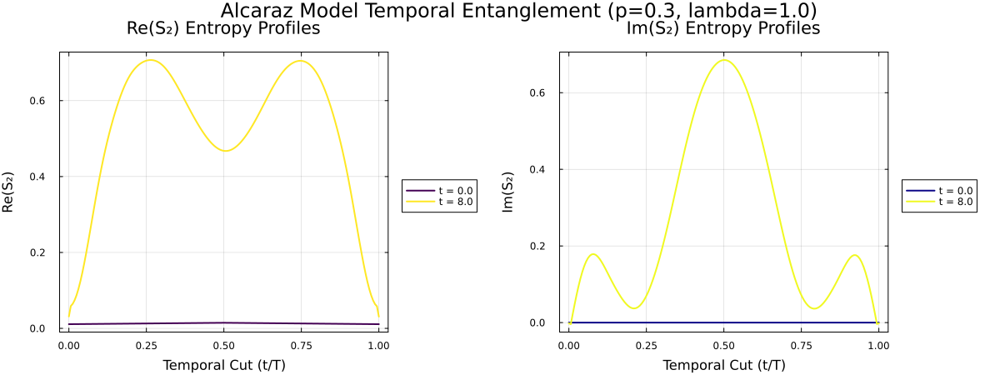

In [41]:
target_times = [0.0, 8.0]

# vamos a ver si sigue el bump en el centro con nbeta=12
p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM", nbeta=4
)

display(fig)


[PM LR|RTM] L=260, cutoff=1.0e-12, maxdim=250, normalize=overlap)   8%  ETA: 0:14:36 ( 0.19  s/it)
   Info: [379]  chi=10 | ds=7.702210830784484e-5 | <R|Rprev> = -1.4537717917006122e-7┌ Warning: PM Stuck after 201/380 steps | ds=4.2031534012831884e-5 | chi=10)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151


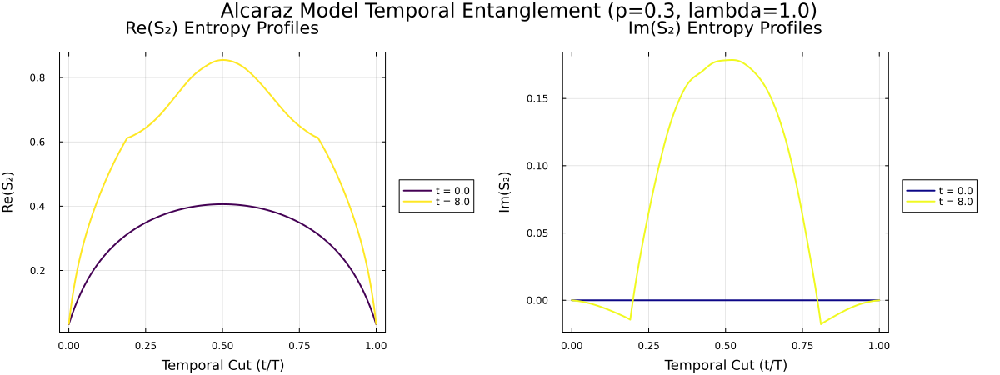

In [43]:
target_times = [0.0, 8.0]

# vamos a ver si sigue el bump en el centro con nbeta=12
p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM", nbeta=100
)

display(fig)


[PM LR|naiveRTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)  15%  ETA: 0:39:05 ( 0.55  s/it)
   Info: [766]  chi=10 | ds=0.04289749655073105 | <R|Rprev> = -1.233476553875461e-5┌ Warning: PM Stuck after 201/767 steps | ds=0.04695413358910516 | chi=10)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 0:22:16


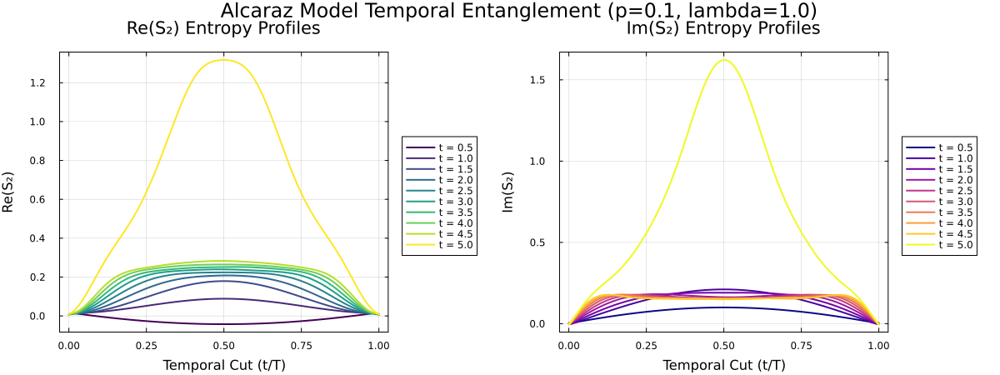

In [ ]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="naiveRTM"
)

display(fig)


[PM LR|densitymatrix] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)  51%  ETA: 17:10:24 (25.35  s/it)
   Info: [2561]  chi=34 | ds=4.4620348272628174e-5 | <R|Rprev> = -5.3424628359571056e-5┌ Warning: PM Stuck after 201/2562 steps | ds=7.194225658724296e-5 | chi=34)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.1... 100%|████████████████████| Time: 19:19:40


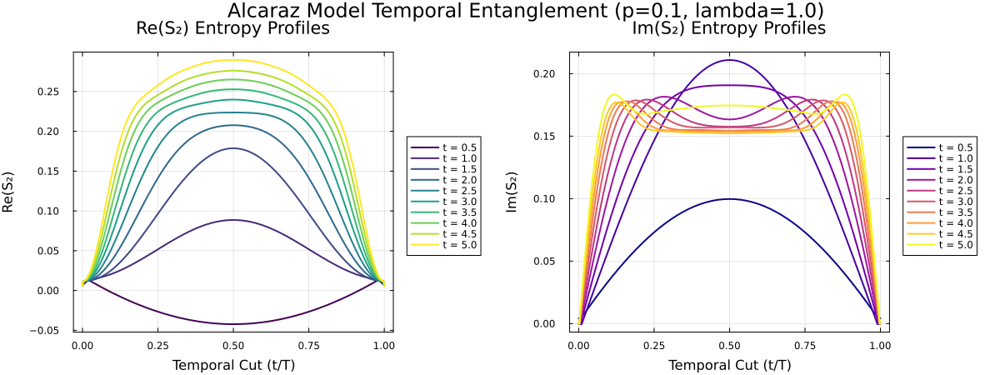

In [26]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.1
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="densitymatrix"
)

display(fig)


---
$p=0.3$

[PM LR|RTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   9%  ETA: 0:05:47 (76.28 ms/it)
   Info: [447]  chi=12 | ds=2.1556377736930976e-5 | <R|Rprev> = -3.255492017415143e-8┌ Warning: PM Stuck after 201/449 steps | ds=2.1921720187223492e-5 | chi=12)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:02:28


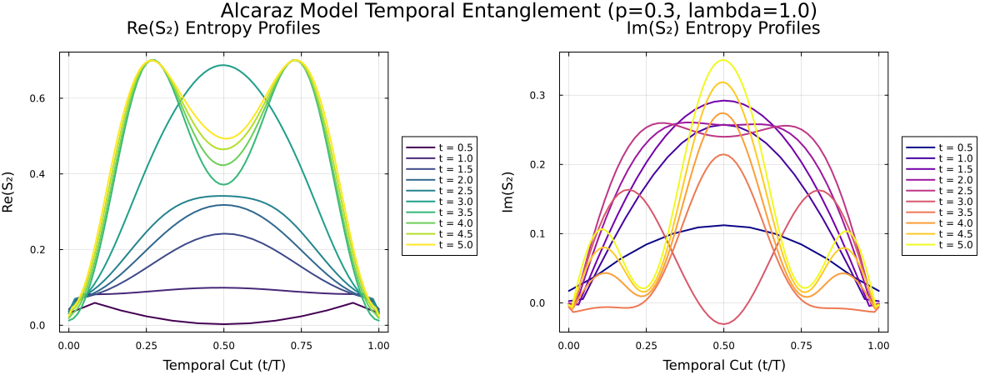

In [14]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|densitymatrix] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 2:41:28 ( 2.07  s/it)
   Info: [327]  chi=74 | ds=1.340896482737719e-6 | <R|Rprev> = -7.131047888938506e-16[ Info: PM Converged after 328 steps | ds=9.249959421198106e-7 | chi=74)
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:45:02


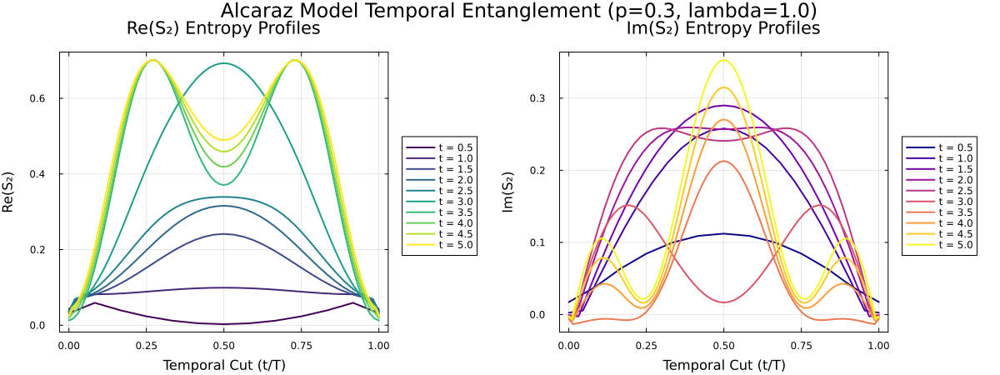

In [28]:
target_times = collect(0.5 : 0.5 : 5.0)

# probando con density matrix para ver si comparado con el de arriba cambia algo
p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|densitymatrix] L=254, cutoff=1.0e-12, maxdim=250, normalize=overlap)   4%  ETA: 7:14:13 ( 5.45  s/it)
   Info: [221]  chi=75 | ds=1.1732967701849617e-6 | <R|Rprev> = -2.7995488691910905e-12[ Info: PM Converged after 222 steps | ds=8.630919531849024e-7 | chi=75)
Computing Profiles for p=0.3... 100%|████████████████████| Time: 15:33:38


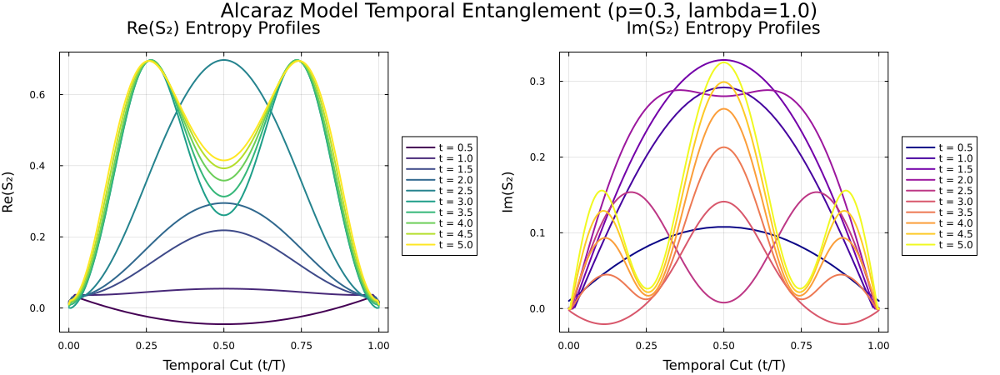

In [30]:
target_times = collect(0.5 : 0.5 : 5.0)

# probando con density matrix para ver si comparado con el de arriba cambia algo
p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.02, maxdim=250, alg="densitymatrix"
)

display(fig)


[PM LR|RTM] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)  13%  ETA: 0:02:20 (32.30 ms/it)
   Info: [668]  chi=10 | ds=1.732093261819223e-6 | <R|Rprev> = -1.7825666868513206e-11[ Info: PM Converged after 669 steps | ds=8.733211043221445e-7 | chi=10)
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:01:19


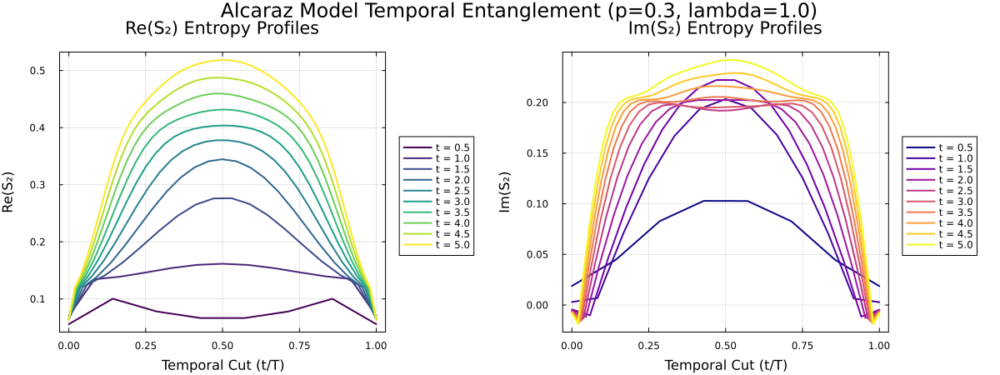

In [13]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250, alg="RTM"
)

display(fig)


In [ ]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250, alg="RTM"
)

display(fig)


[PM LR|naiveRTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)  13%  ETA: 1:04:44 ( 0.89  s/it)
   Info: [651]  chi=14 | ds=0.02412640417450934 | <R|Rprev> = -0.00015643807292686331┌ Warning: norm² is 74628.0219380998 - 2.3283064365386963e-10im, which is not real up to a relative tolerance of 2.220446049250313e-15 and an absolute tolerance of 2.220446049250313e-15. Taking the real part, which may not be accurate.
└ @ ITensorMPS ~/.julia/packages/ITensorMPS/fZDBz/src/abstractmps.jl:1246
┌ Warning: PM Stuck after 201/652 steps | ds=0.01916965607251353 | chi=13)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.3... 100%|████████████████████| Time: 0:24:40


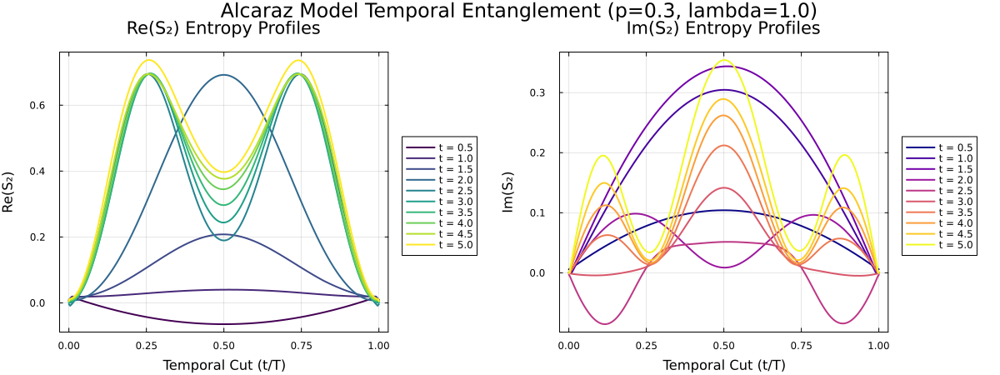

In [74]:
target_times = collect(0.5 : 0.5 : 5.0)


p_val=0.3
fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250
)

display(fig)


---
$p=0.5$

[PM LR|naiveRTM] L=54, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 0:05:08 (62.84 ms/it)
   Info: [98]  chi=10 | ds=1.1844512799452644e-6 | <R|Rprev> = -1.5416885874915182e-12[ Info: PM Converged after 99 steps | ds=9.097711393124541e-7 | chi=10)
Computing Profiles for p=0.5... 100%|████████████████████| Time: 0:00:37


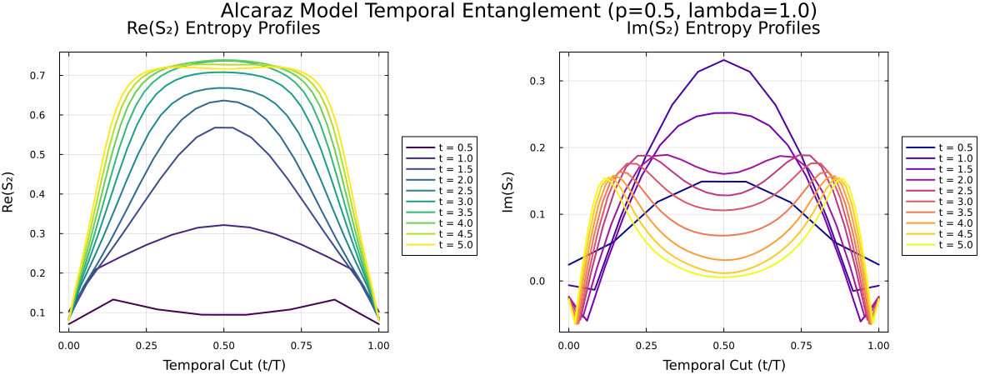

In [12]:
target_times = collect(0.5 : 0.5 : 5.0)
# p_values = [0.0, 0.5]
# p_values = [0.0, 0.5, 1.0, 1.5, 2.0, 3.0]

p_val=0.5

fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.1, maxdim=250
)

display(fig)


[PM LR|naiveRTM] L=24, cutoff=1.0e-12, maxdim=250, normalize=overlap)   5%  ETA: 0:02:56 (36.94 ms/it)
   Info: [231]  chi=16 | ds=0.013052094183681084 | <R|Rprev> = -6.015314381164575e-5┌ Warning: PM Stuck after 201/234 steps | ds=0.011940038218826166 | chi=16)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.5... 100%|████████████████████| Time: 0:01:18


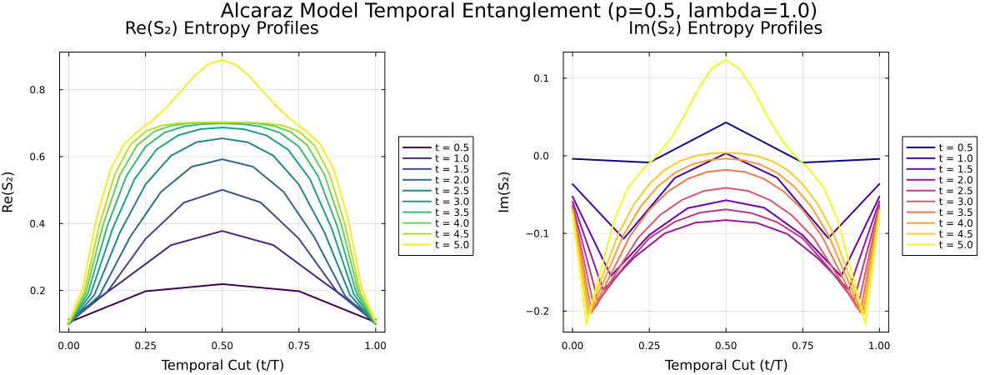

In [11]:
target_times = collect(0.5 : 0.5 : 5.0)
# p_values = [0.0, 0.5]
# p_values = [0.0, 0.5, 1.0, 1.5, 2.0, 3.0]

p_val=0.5

fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.25, maxdim=250
)

display(fig)


[PM LR|naiveRTM] L=104, cutoff=1.0e-12, maxdim=250, normalize=overlap)   2%  ETA: 0:10:59 ( 0.13  s/it)
   Info: [103]  chi=12 | ds=1.3226430699564418e-6 | <R|Rprev> = -2.282618538629322e-13[ Info: PM Converged after 105 steps | ds=8.738084229520382e-7 | chi=12)
Computing Profiles for p=0.5... 100%|████████████████████| Time: 0:02:57


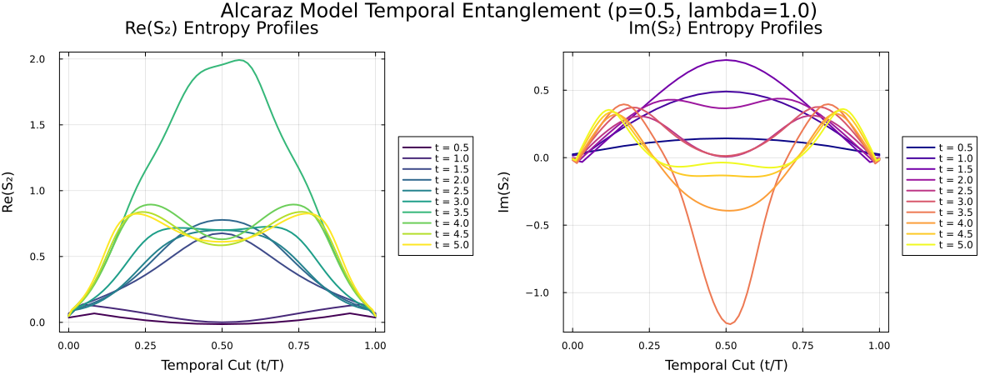

In [71]:
target_times = collect(0.5 : 0.5 : 5.0)
# p_values = [0.0, 0.5]
# p_values = [0.0, 0.5, 1.0, 1.5, 2.0, 3.0]

p_val=0.5

fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.05, maxdim=250
)

display(fig)


[PM LR|naiveRTM] L=504, cutoff=1.0e-12, maxdim=250, normalize=overlap)   7%  ETA: 2:07:06 ( 1.65  s/it)
   Info: [368]  chi=24 | ds=0.013303679856275952 | <R|Rprev> = -3.274968502330739e-5┌ Warning: PM Stuck after 201/369 steps | ds=0.01355736375472627 | chi=24)
└ @ ITransverse ~/.julia/packages/ITransverse/8pmYI/src/power_method/pm.jl:151
Computing Profiles for p=0.5... 100%|████████████████████| Time: 0:26:15


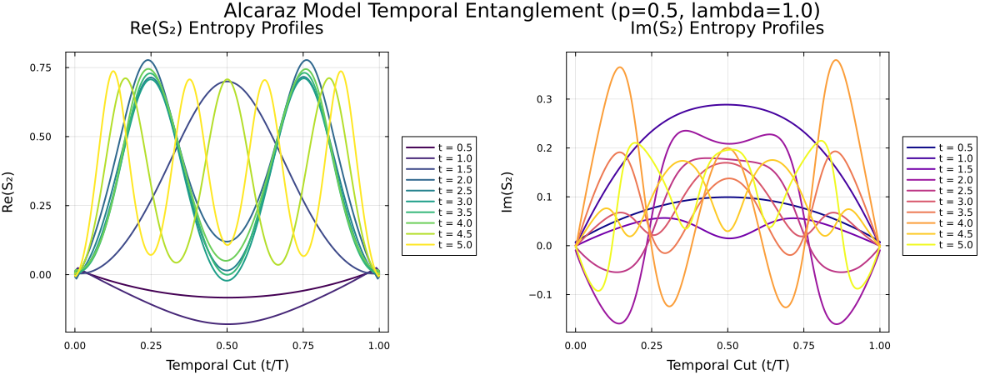

In [8]:
target_times = collect(0.5 : 0.5 : 5.0)
# p_values = [0.0, 0.5]
# p_values = [0.0, 0.5, 1.0, 1.5, 2.0, 3.0]

p_val=0.5

fig = plot_entropy_profiles(
    expH_alcaraz, target_times; 
    p=p_val, lambda=1.0, dt=0.01, maxdim=250
)

display(fig)


---